In [2]:
#Importing required libraries 
import numpy as np 
import os 
from collections import Counter
import pandas as pd
import nltk

# preprocessing 
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences

#pca for dimensionality reduction 
from sklearn.decomposition import PCA

In [3]:
df_pos = pd.read_csv(r'combined_pos.txt', sep=";", names=['Text',])
df_pos['Label'] = 1

# negative movie reviews
df_neg = pd.read_csv(r'combined_neg.txt', sep=";", names=['Text',])
df_neg['Label'] = 0

# Combine the two dataframes 
merge = [df_pos, df_neg]
df = pd.concat(merge).reset_index(drop=True)

In [4]:
#Preview the dataframes 
print(df_pos.head())
print()
print(df_neg.head())
print()
print(df.head())

                                                Text  Label
0  Bromwell High is a cartoon comedy. It ran at t...      1
1  Homelessness (or Houselessness as George Carli...      1
2  Brilliant over-acting by Lesley Ann Warren. Be...      1
3  This is easily the most underrated film inn th...      1
4  This is not the typical Mel Brooks film. It wa...      1

                                                Text  Label
0  Story of a man who has unnatural feelings for ...      0
1  Airport '77 starts as a brand new luxury 747 p...      0
2  This film lacked something I couldn't put my f...      0
3  Sorry everyone,,, I know this is supposed to b...      0
4  When I was little my parents took me along to ...      0

                                                Text  Label
0  Bromwell High is a cartoon comedy. It ran at t...      1
1  Homelessness (or Houselessness as George Carli...      1
2  Brilliant over-acting by Lesley Ann Warren. Be...      1
3  This is easily the most underrated 

In [5]:
#preview the number of positive and negative Labels 
df['Label'].value_counts()

1    12494
0    12493
Name: Label, dtype: int64

In [6]:
# Function to clean the text by removing punctuations and english language stopwords 
from nltk.tokenize import word_tokenize
def clean_text(doc):
    stop_words = set(nltk.corpus.stopwords.words('english'))  
    tokenizer = nltk.RegexpTokenizer(r"\w+")
    
    tokens = word_tokenize(doc)
    tokens = [word.lower() for word in tokens]
    txt = [word for word in tokens if word not in stop_words and (word.isalpha() == True) and (len(word)> 1) and (word != 'br')]
    final_txt = " ".join(map(str, txt))
    return final_txt

In [7]:
# Create a new dataframe for the cleaned text and call the clean_text function 
df_clean = df
df_clean['tokens'] = df_clean.apply(lambda row: clean_text(row['Text']),axis =1)

In [8]:
#preview the cleaned dataframe 
df_clean.head()

,Text,Label,tokens
0,Bromwell High is a cartoon comedy. It ran at t...,1,bromwell high cartoon comedy ran time programs...
1,Homelessness (or Houselessness as George Carli...,1,homelessness houselessness george carlin state...
2,Brilliant over-acting by Lesley Ann Warren. Be...,1,brilliant lesley ann warren best dramatic hobo...
3,This is easily the most underrated film inn th...,1,easily underrated film inn brooks cannon sure ...
4,This is not the typical Mel Brooks film. It wa...,1,typical mel brooks film much less slapstick mo...


In [9]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(df_clean['tokens'])
encoded_clean_data = tokenizer.texts_to_sequences(df_clean['tokens'])
encoded_clean_data_padded = pad_sequences(encoded_clean_data, maxlen=100, padding='post')
print(encoded_clean_data[0])
print()
print(encoded_clean_data_padded[0])

[18669, 207, 896, 108, 1882, 8, 5292, 261, 41, 4983, 54, 4485, 5568, 353, 143, 18669, 207, 1774, 12, 2216, 526, 4983, 21475, 1775, 9378, 5426, 1312, 11, 100, 1026, 4983, 23411, 42293, 112, 755, 2696, 4984, 499, 1312, 93, 256, 1192, 3353, 611, 3298, 261, 1011, 14348, 207, 225, 248, 2682, 8683, 3, 4983, 1192, 2288, 18669, 207, 386, 31, 1249, 446, 25, 18669, 207, 126, 7686, 2066]

[18669   207   896   108  1882     8  5292   261    41  4983    54  4485
  5568   353   143 18669   207  1774    12  2216   526  4983 21475  1775
  9378  5426  1312    11   100  1026  4983 23411 42293   112   755  2696
  4984   499  1312    93   256  1192  3353   611  3298   261  1011 14348
   207   225   248  2682  8683     3  4983  1192  2288 18669   207   386
    31  1249   446    25 18669   207   126  7686  2066     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0]


In [10]:
# Use the GloVE word embeddings file as pretrained word embeddings
word_embeddings = {}
file = open(r'glove.6B.100d.txt', encoding='utf8')
for line in file:
    val = line.split()
    word = val[0]
    coefs = np.asarray(val[1:], dtype = 'float32')
    word_embeddings[word] = coefs
file.close()
print('Number of word embeddings:' + str(len(word_embeddings)))

Number of word embeddings:400001


In [11]:
# create a embedding matrix by using words only found in the dataset 
words_in_data = len(tokenizer.word_index) + 1
embedding_matrix = np.zeros((words_in_data, 100))
for word, i in tokenizer.word_index.items():
    temp = word_embeddings.get(word)
    if temp is not None:
        embedding_matrix[i] = temp

In [12]:
#PCA for dimensionality reduction of embedding matrix feature space 
dim_reduc = PCA(2).fit(embedding_matrix)
data_dim_reduc = dim_reduc.transform(embedding_matrix)

In [13]:
print(embedding_matrix.shape)

(67156, 100)


In [14]:
print(data_dim_reduc[0])
print(data_dim_reduc.shape)

[0.0415178  0.32232709]
(67156, 2)


In [15]:
from minisom import MiniSom
#create a self-organizing map that will cluster the embedding matrix feature space into 2 clusters 
som_shape = (1, 2)
#use the minisom library to set SOM parameters to have neighborhood radius as 1 and learning rate as 0.5
som = MiniSom(1, 2, 2, sigma=1, learning_rate=0.5,
              neighborhood_function='gaussian', random_seed=10)

#train the SOM to cluster the embedding matrix feature space 
som.train_random(data_dim_reduc, 500, verbose=True)

 [ 500 / 500 ] 100% - 0:00:00 left 
 quantization error: 2.865709655677127


In [16]:
# calculate the winning nodes 
winner_coordinates = np.array([som.winner(x) for x in data_dim_reduc]).T

#distribute coordinates of winning nodes onto 2D axis
cluster_index = np.ravel_multi_index(winner_coordinates, som_shape)

In [17]:
print(winner_coordinates.shape)

(2, 67156)


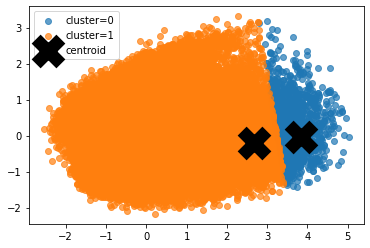

In [18]:
# use MiniSom documentation to plot the clusters 
import matplotlib.pyplot as plt
# plotting the clusters using the first 2 dimentions of the data
for c in np.unique(cluster_index):
    plt.scatter(data_dim_reduc[cluster_index == c, 0],
                data_dim_reduc[cluster_index == c, 1], label='cluster='+str(c), alpha=.7)

for centroid in som.get_weights():
    plt.scatter(centroid[:, 0], centroid[:, 1], marker='x', 
                s=80, linewidths=35, color='k', label='centroid')
plt.legend();

In [19]:
#PCA for dimensionality reduction of document vectors feature space 
dim_reduc_2 = PCA(2).fit(encoded_clean_data_padded)
data_dim_reduc_2 = dim_reduc.transform(encoded_clean_data_padded)

In [20]:
print(encoded_clean_data_padded.shape)

(24987, 100)


In [21]:
print(data_dim_reduc_2[0])
print(data_dim_reduc_2.shape)

[1169.30039052 7225.97191682]
(24987, 2)


In [22]:
#create a self-organizing map that will cluster the document vectors feature space into 2 clusters 
som_shape_2 = (1, 2)

#use the minisom library to set SOM parameters to have neighborhood radius as 1 and learning rate as 0.5
som_2 = MiniSom(1, 2, 2, sigma=1, learning_rate=0.5,
              neighborhood_function='gaussian', random_seed=10)

#train the SOM to cluster the document vectors feature space
som.train_random(data_dim_reduc_2, 500, verbose=True)

 [ 500 / 500 ] 100% - 0:00:00 left 
 quantization error: 6266.030831565144


In [24]:
# calculate the winning nodes 
winner_coordinates_2 = np.array([som_2.winner(x) for x in data_dim_reduc_2]).T

#distribute coordinates of winning nodes onto 2D axis
cluster_index_2 = np.ravel_multi_index(winner_coordinates_2, som_shape_2)

In [25]:
print(winner_coordinates_2.shape)

(2, 24987)


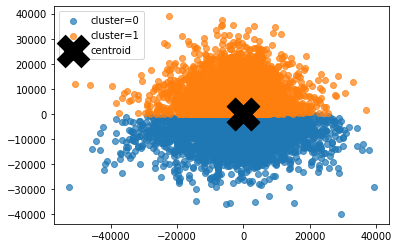

In [27]:
# use MiniSom documentation to plot the clusters 
for c in np.unique(cluster_index):
    # plotting the clusters using the first 2 dimentions of the data
    plt.scatter(data_dim_reduc_2[cluster_index_2 == c, 0],
                data_dim_reduc_2[cluster_index_2 == c, 1], label='cluster='+str(c), alpha=.7)

for centroid in som_2.get_weights():
    plt.scatter(centroid[:, 0], centroid[:, 1], marker='x', 
                s=80, linewidths=35, color='k', label='centroid')
plt.legend();